# Transforming images

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
cv2.__version__

'3.4.2'

## Helper functions for displaying images

In [3]:
def show_img(img, title = ''):
    plt.figure(figsize = (10,15));
    plt.title(title)
    plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
    
def show_grayscale_img(img, title = ''):
    plt.figure(figsize = (10,15));
    plt.title(title)
    plt.imshow(img, cmap='gray')
    

## Loading images

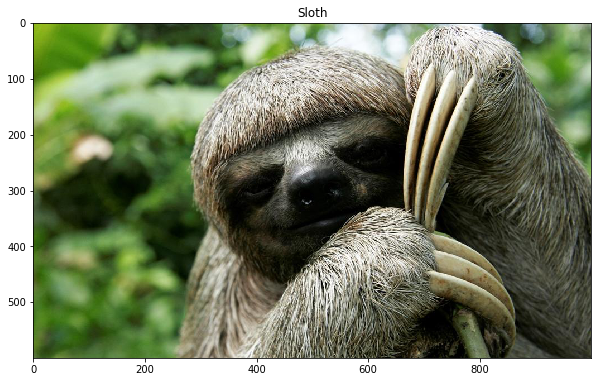

In [34]:
sloth1 = cv2.imread("./img/sloth1.jpg")
sloth2 = cv2.imread("./img/sloth2.jpeg")
sloth3 = cv2.imread("./img/sloth3.jpg")

show_img(sloth2, 'Sloth')

In [35]:
height, width = sloth2.shape[:2]

In [36]:
height, width

(600, 1000)

## Translating images

In [37]:
translation_matrix = np.float32([
                                [1,0,-100], # x axis (we only change these two values)
                                [0,1,-100] # y axis
                                ])

sloth2_translation = cv2.warpAffine(sloth2, translation_matrix, (width, height))
show_img(sloth2_translation)

## Rotation

In [77]:
x_center = width/2
y_center = height/2
angle_of_rotation = 42

# might want to change the scale to avoid black areas when we rotate, but normally we keep it as 1
scale = 1

rotation_matrix = cv2.getRotationMatrix2D((x_center, y_center), angle_of_rotation, scale)
rotation_matrix

array([[  0.74314483,   0.66913061, -72.31159465],
       [ -0.66913061,   0.74314483, 411.62185554]])

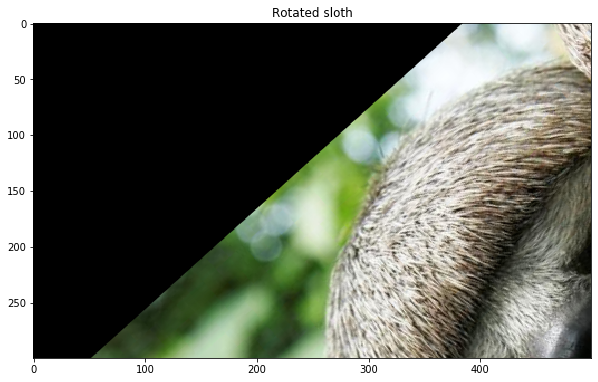

In [78]:
sloth2_rotated = cv2.warpAffine(sloth2, rotation_matrix, (width//2, height//2))
show_img(sloth2_rotated, 'Rotated sloth')

## Downsampling images

In [79]:
sloth_lowres = cv2.imread("./img/sloth_lowres.png")

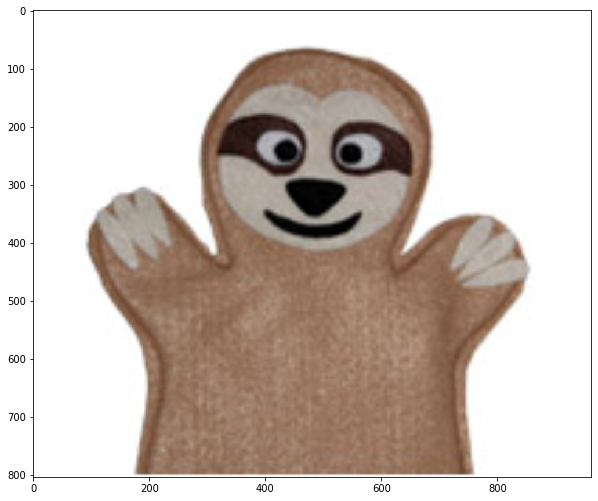

In [80]:
show_img(sloth_lowres)

In [81]:
sloth_height, sloth_width = sloth_lowres.shape[:2]
sloth_resized = cv2.resize(sloth_lowres, (sloth_width//2, sloth_height//2), interpolation=cv2.INTER_AREA)

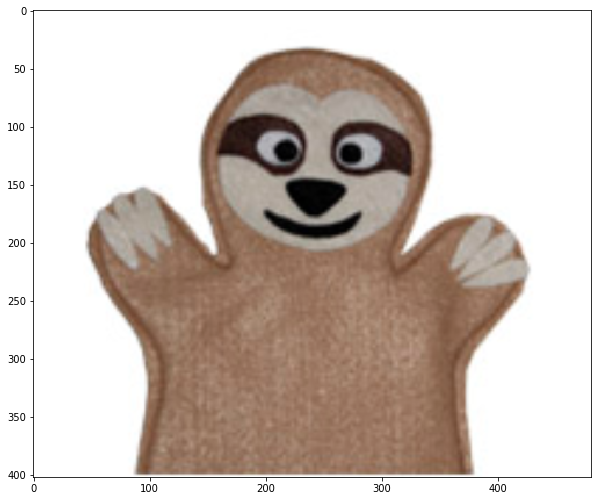

In [82]:
show_img(sloth_resized)

### Another way of resizing, using Lanczos interpolation

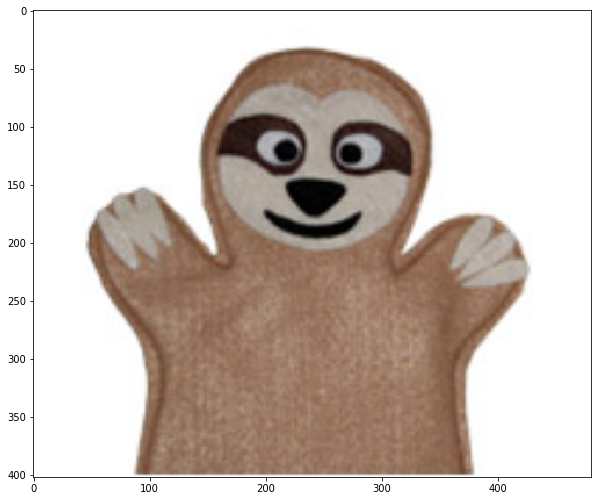

In [83]:

sloth_resized = cv2.resize(sloth_lowres, None, fx=0.5, fy=0.5, interpolation=cv2.INTER_LANCZOS4)
show_img(sloth_resized)

## Upsampling

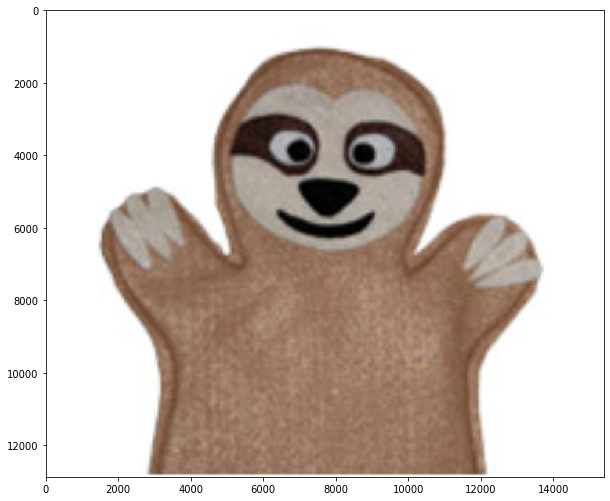

In [89]:
sloth_resized = cv2.resize(sloth_lowres, None, fx=8, fy=8, interpolation=cv2.INTER_AREA) # INTER_LANCZOS4
show_img(sloth_resized)

## Image pydamids

### Gaussian pyramid (downsampling)

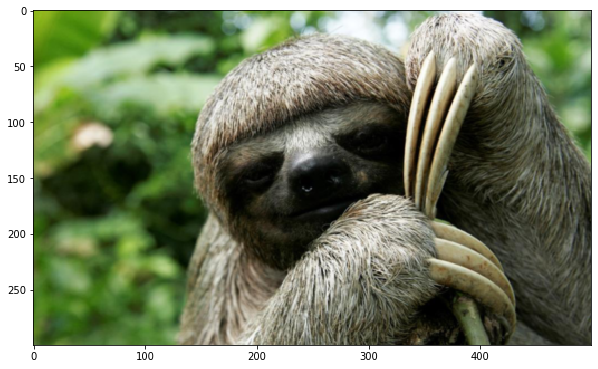

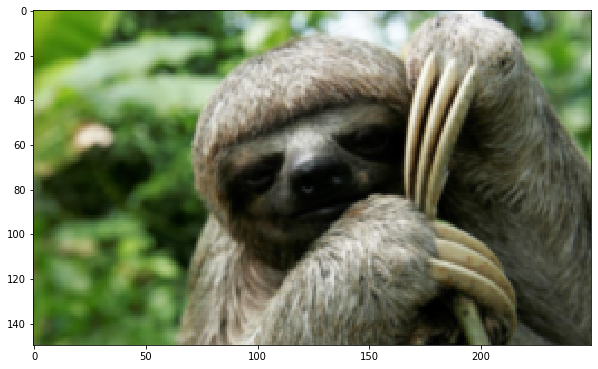

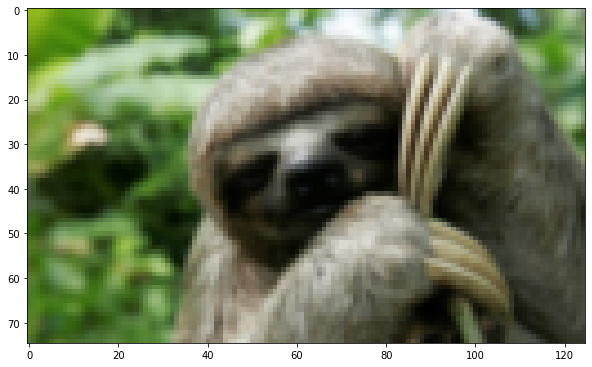

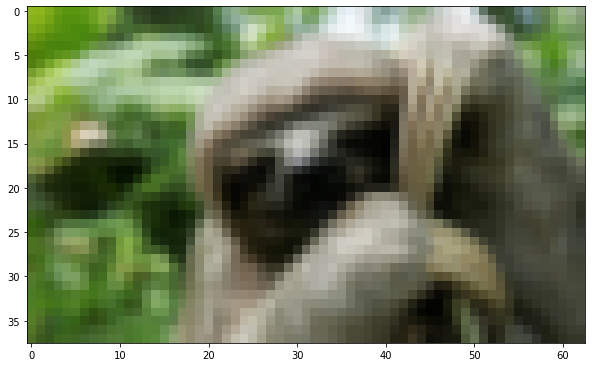

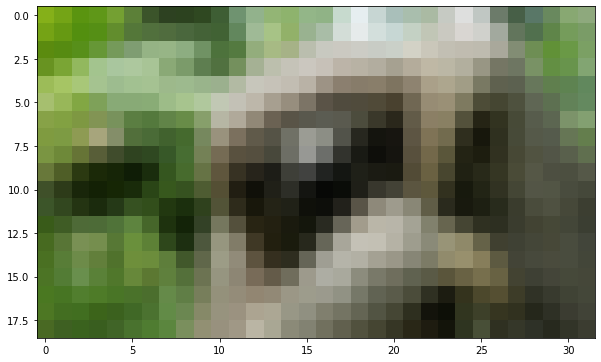

In [91]:
sloth_copy = sloth2.copy()
for i in range(5):
    sloth_copy = cv2.pyrDown(sloth_copy)
    show_img(sloth_copy)

### Laplacian pyramid

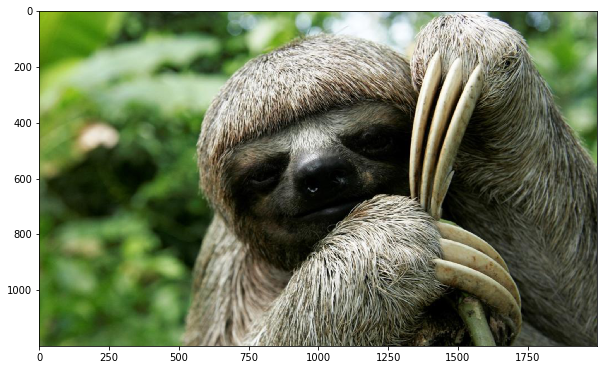

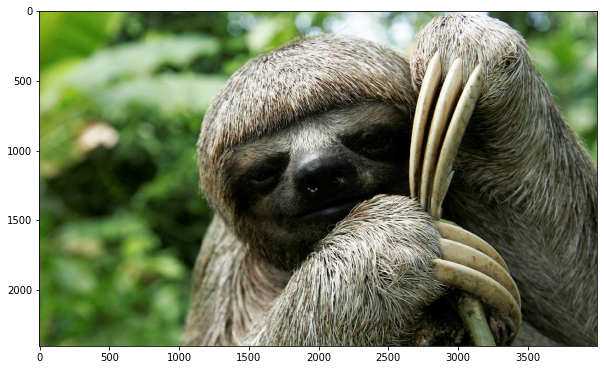

In [94]:
sloth_copy = sloth2.copy()
for i in range(2): # takes a long time to upsample
    sloth_copy = cv2.pyrUp(sloth_copy)
    show_img(sloth_copy)

## Cropping

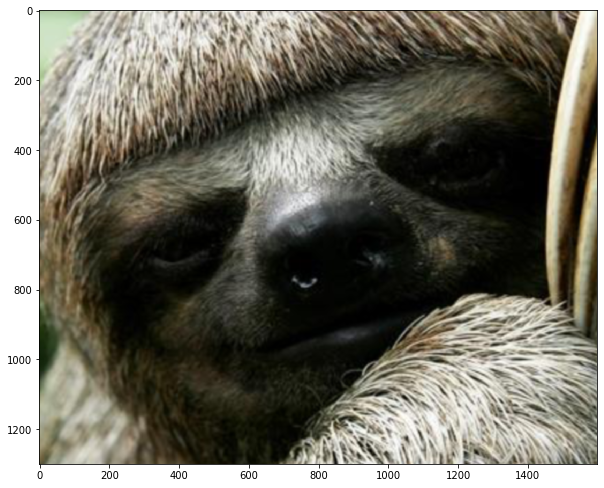

In [109]:
# Like rows and columns in an Excel sheet
start_row = 500 
end_row = 1800
start_col = 1200
end_col = 2800

cropped_img = sloth_copy[start_row:end_row, start_col:end_col]

show_img(cropped_img)

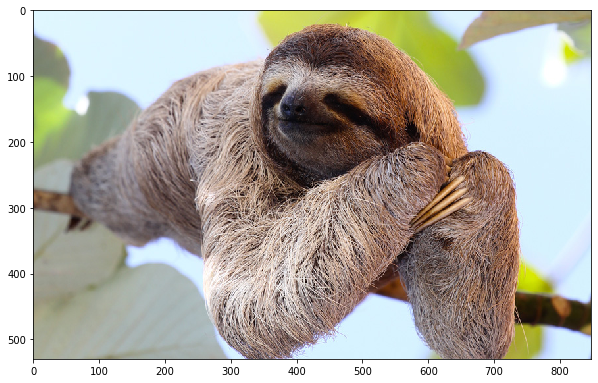

In [111]:
sloth4 = cv2.imread("./img/sloth_CR.jpg")
show_img(sloth4)

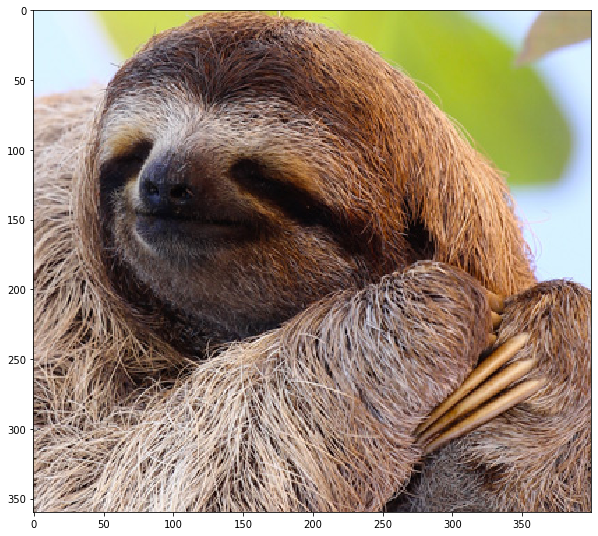

In [113]:
# Like rows and columns in an Excel sheet
start_row = 20 
end_row = 380
start_col = 300
end_col = 700

cropped_img = sloth4[start_row:end_row, start_col:end_col]

show_img(cropped_img)

### Let's upsample the cropped image a bit

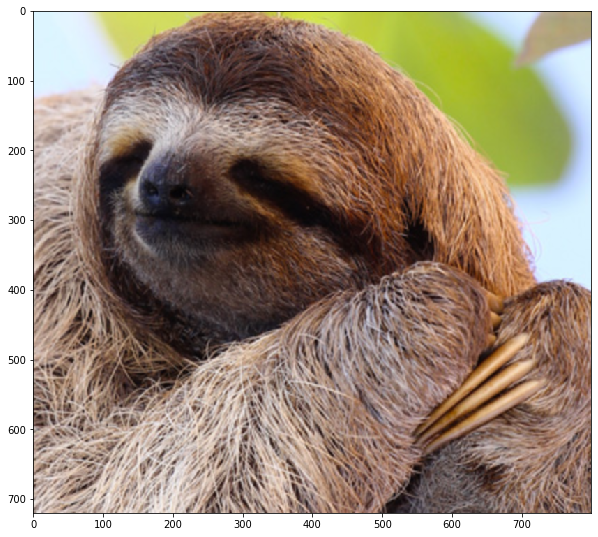

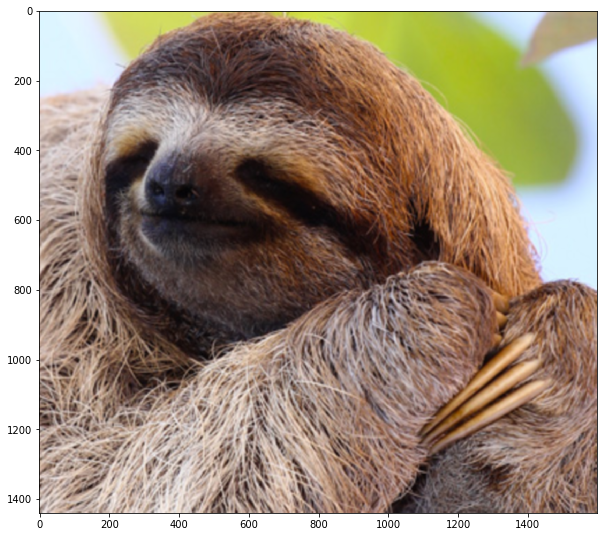

In [116]:

sloth_copy = cropped_img.copy()
for i in range(2): # takes a long time to upsample
    sloth_copy = cv2.pyrUp(sloth_copy)
    show_img(sloth_copy)

Our sloth looks much better after two pyramids :)

## Brightening and darkening images

We create a matrix of ones and multiply it with a constant (here 50). Then we add or subtract that value from the each pixel in the picture matrix to brighten it or darken it. 

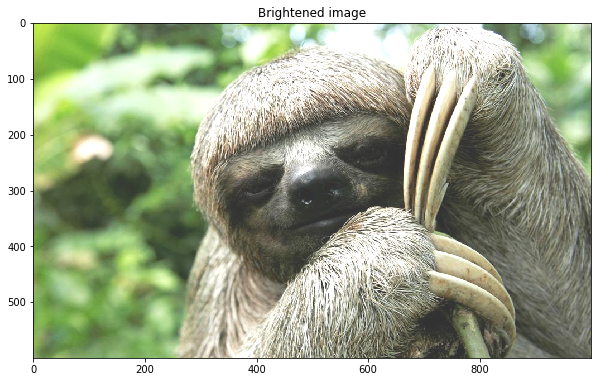

In [133]:
pixel_values_matrix = np.ones(sloth2.shape, dtype = "uint8") * 50 

brightened_image = cv2.add(sloth2, pixel_values_matrix)
show_img(brightened_image, "Brightened image")

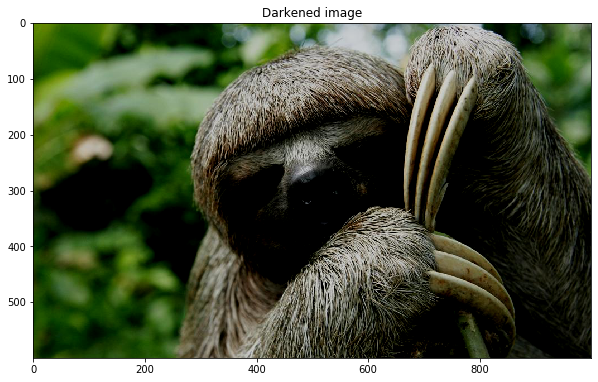

In [132]:
dark_image = cv2.subtract(sloth2, pixel_values_matrix)
show_img(dark_image, "Darkened image")

### Let's split the channels

And increase the values of the blue channel.

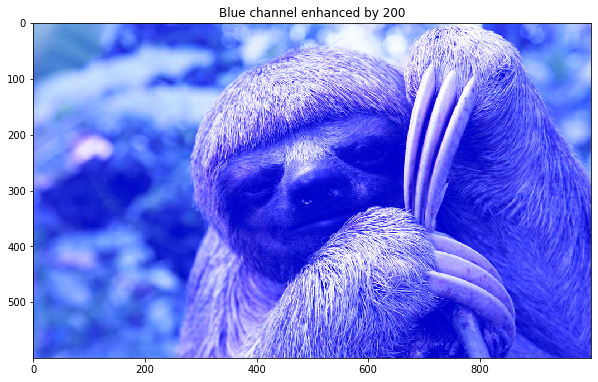

In [139]:
B, G, R = cv2.split(sloth2)

pixel_values_matrix_one_channel = np.ones((height, width), dtype='uint8') * 200

# modifying the blue channel
B = cv2.add(B, pixel_values_matrix_one_channel)

# merging the channels again
modified_img = cv2.merge([B, G, R])
show_img(modified_img, "Blue channel enhanced by 200")

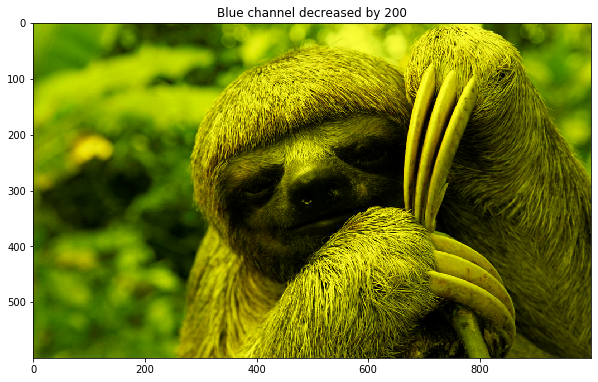

In [140]:
B, G, R = cv2.split(sloth2)

pixel_values_matrix_one_channel = np.ones((height, width), dtype='uint8') * 200

# modifying the blue channel
B = cv2.subtract(B, pixel_values_matrix_one_channel)

# merging the channels again
modified_img = cv2.merge([B, G, R])
show_img(modified_img, "Blue channel decreased by 200")

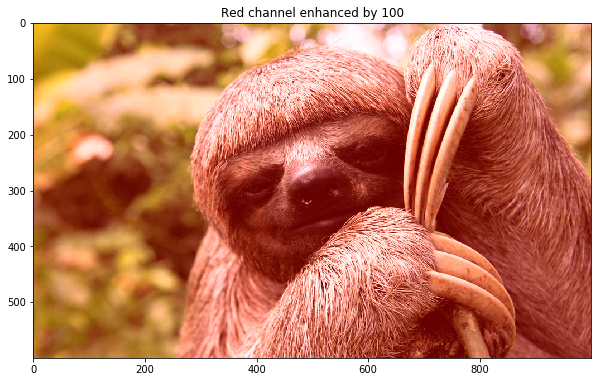

In [143]:
B, G, R = cv2.split(sloth2)

pixel_values_matrix_one_channel = np.ones((height, width), dtype='uint8') * 100

# modifying the blue channel
R = cv2.add(R, pixel_values_matrix_one_channel)

# merging the channels again
modified_img = cv2.merge([B, G, R])
show_img(modified_img, "Red channel enhanced by 100")

## Enhancing text

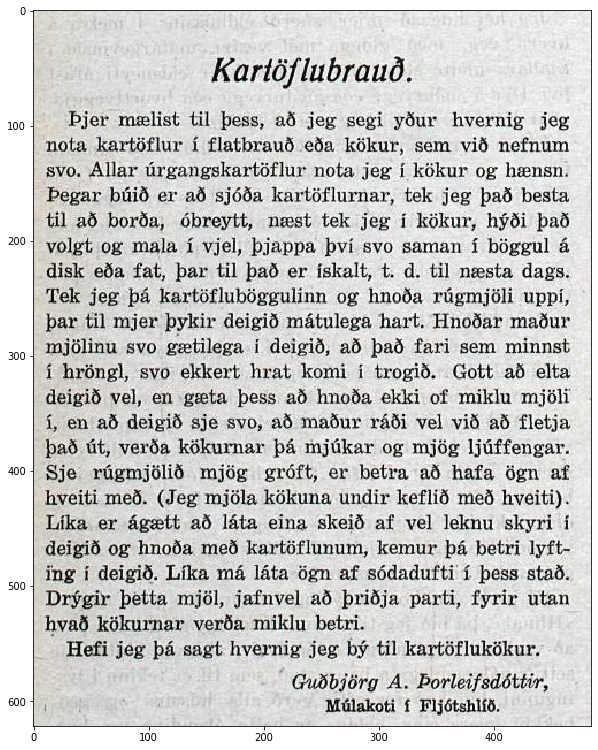

In [201]:
text = cv2.imread("./img/kartoflubraud.jpg")
show_img(text)

### Upsampling a bit to distinguish the smaller characters better

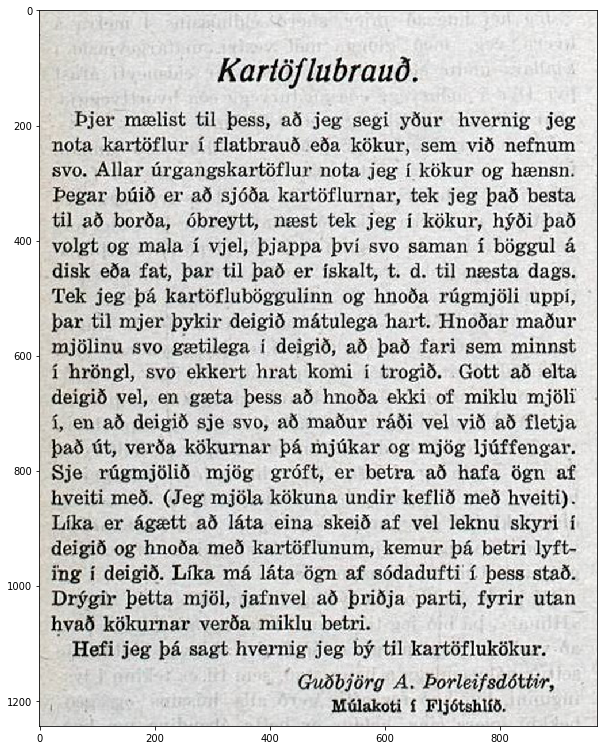

In [320]:
img = cv2.resize(recipe, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
show_img(img)

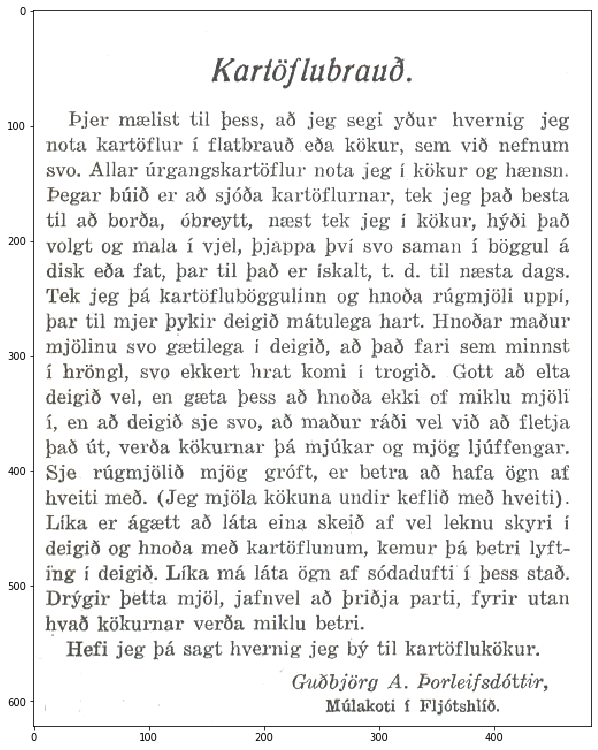

In [345]:
pixel_values_matrix = np.ones(recipe.shape,dtype='uint8') * 70
text2 = cv2.add(text,pixel_values_matrix)

show_img(text2)

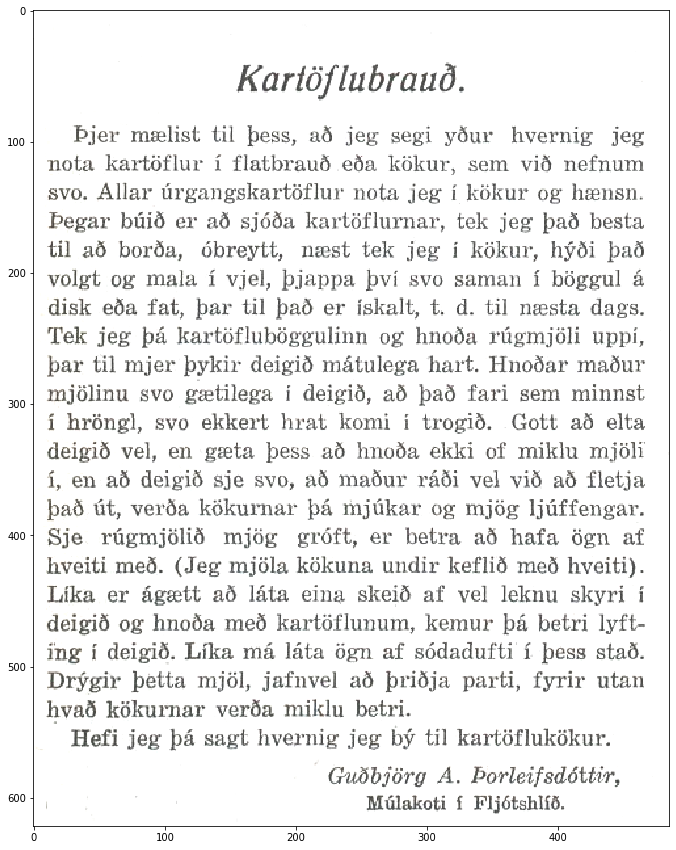

In [346]:

text_hsv = text2
plt.figure(figsize = (20,15))
hsv_img = cv2.cvtColor(text_hsv, cv2.COLOR_BGR2HSV)
hue =  hsv_img[:,:,0]
saturation = hsv_img[:,:,1]
value = hsv_img[:,:,2]

plt.imshow(cv2.cvtColor(text_hsv,cv2.COLOR_BGR2RGB));

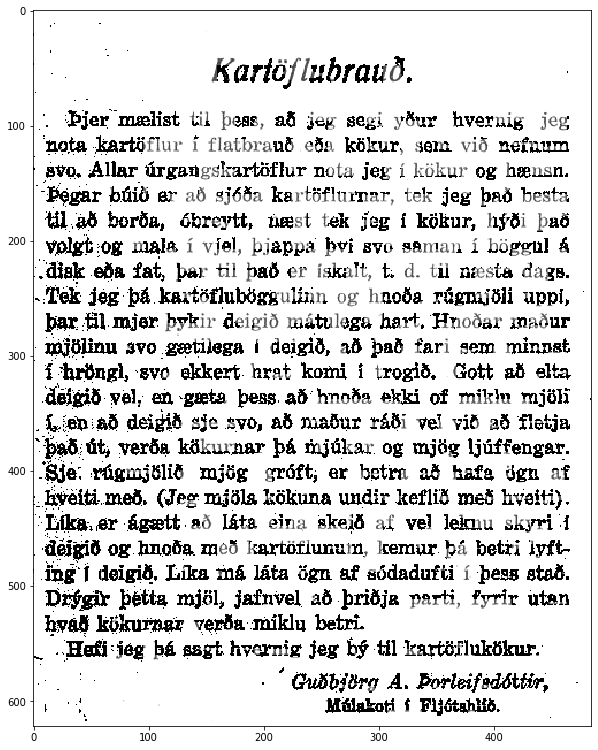

In [347]:
lower_range = (0,0,0)
upper_range = (0,0,255)
hsv_mask = cv2.inRange(hsv_img, lower_range, upper_range)
masked_image = np.copy(text_hsv)
masked_image[hsv_mask == 0 ] = [0,0,0]
show_img(masked_image)

## Bitwise operators

We create a circle and a square and apply some bitwise operations to them.

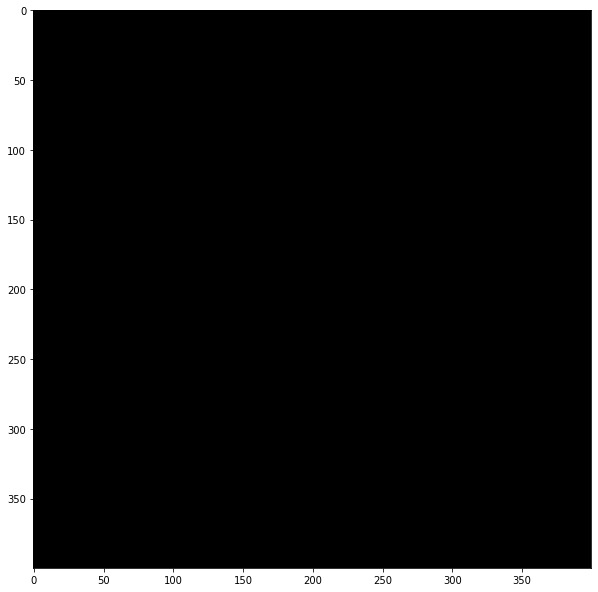

In [348]:
# creating a canvas for the 
canvas = np.zeros((400,400), np.uint8)
show_grayscale_img(canvas)

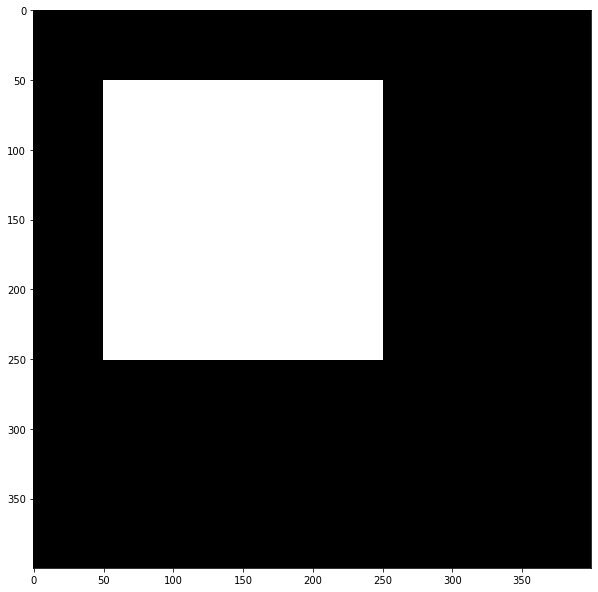

In [349]:
square = canvas.copy()
cv2.rectangle(square, (50,50), (250,250),255,-1)
show_grayscale_img(square)

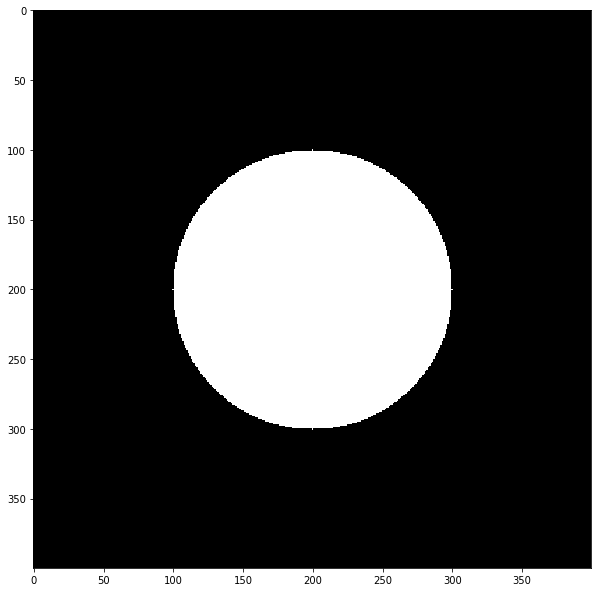

In [350]:
circle = canvas.copy()
cv2.circle(circle, (200, 200), 100, 255, -1)
show_grayscale_img(circle)

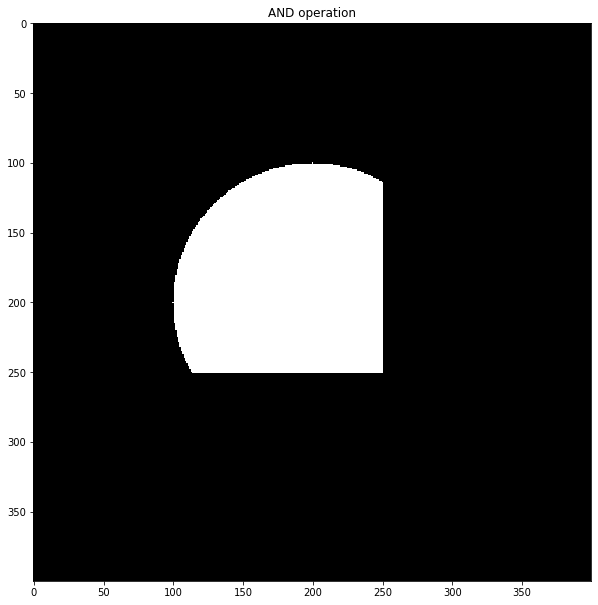

In [351]:
and_operation = cv2.bitwise_and(circle, square)
show_grayscale_img(and_operation, "AND operation")

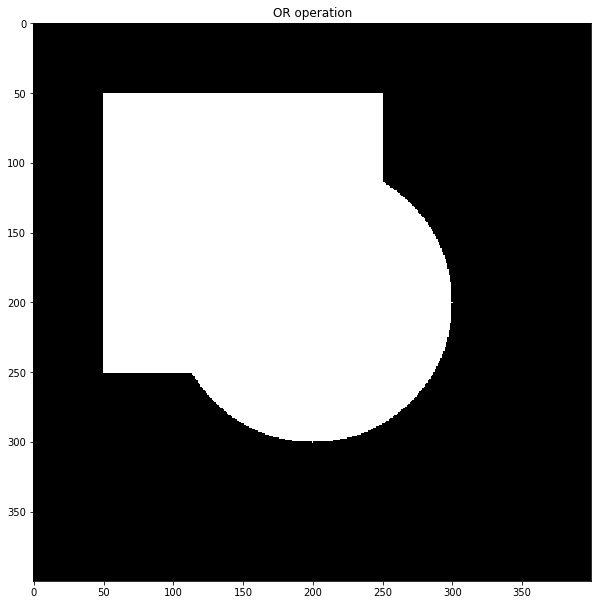

In [352]:
or_operation = cv2.bitwise_or(circle, square)
show_grayscale_img(or_operation, "OR operation")

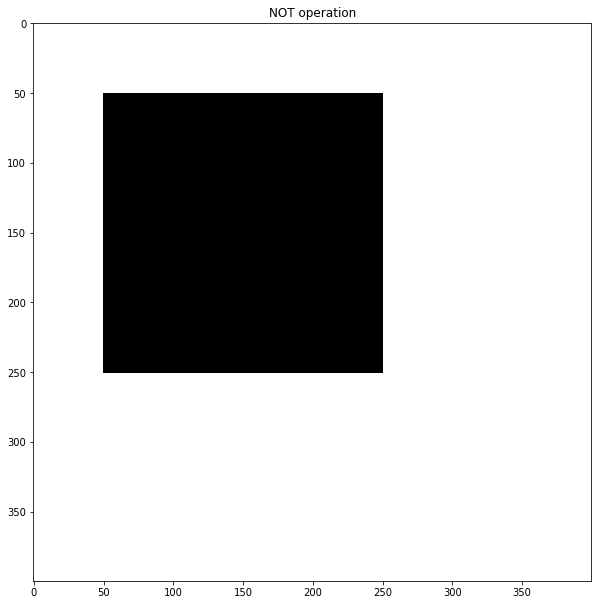

In [353]:
not_operation = cv2.bitwise_not(square)
show_grayscale_img(not_operation, "NOT operation")

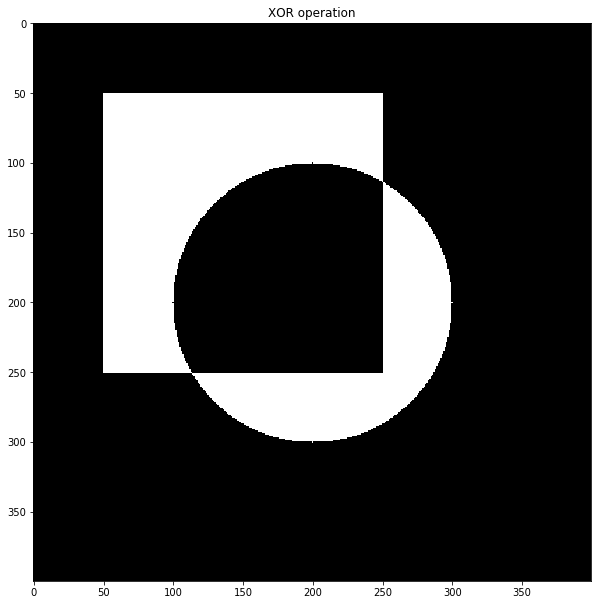

In [354]:
xor_operation = cv2.bitwise_xor(circle, square)
show_grayscale_img(xor_operation, "XOR operation")

## Blur

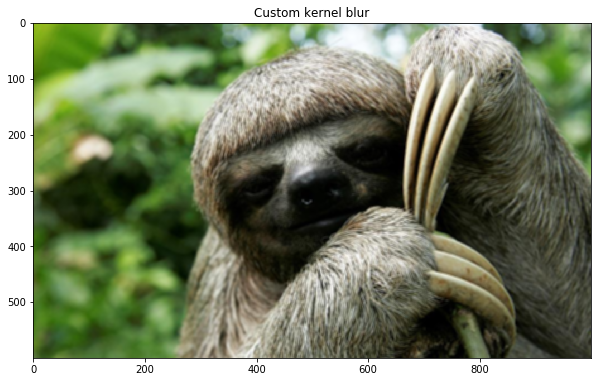

In [355]:
kernel = np.ones((5,5), np.float32)/25 # 5 times 5 is 25 numbers
blur_img = cv2.filter2D(sloth2, -1, kernel)
show_img(blur_img, "Custom kernel blur")

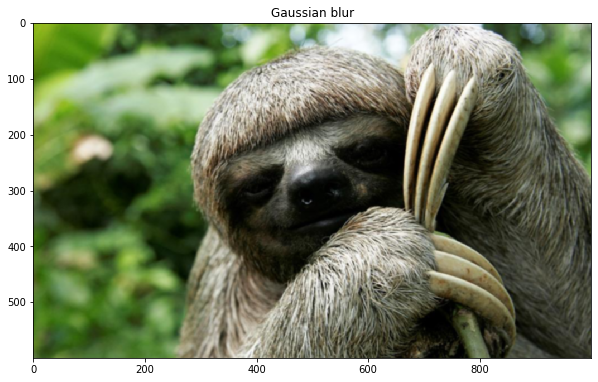

In [356]:
gaussian_blur = cv2.GaussianBlur(sloth2,(5,5),0) # can only use odd numbers!
show_img(gaussian_blur, "Gaussian blur")

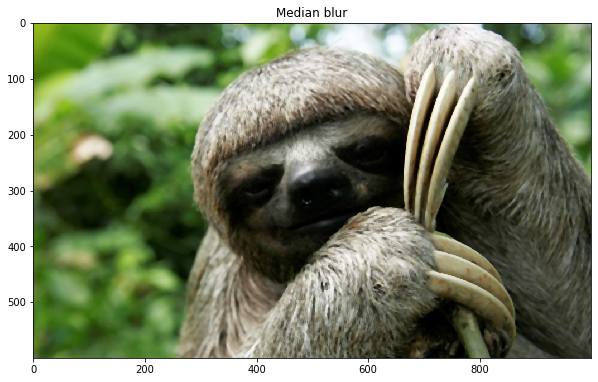

In [655]:
blur = cv2.medianBlur(sloth2, 5)
show_img(blur, "Median blur")

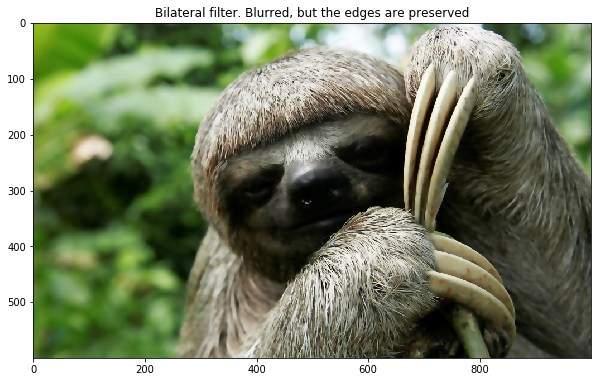

In [358]:
blur = cv2.bilateralFilter(sloth2, 9,75,75)
show_img(blur, "Bilateral filter. Blurred, but the edges are preserved")

## Sharpening

In [359]:
sharpening_kernel = np.ones((3,3), np.float32) * -1
sharpening_kernel[1,1] = 9
sharpening_kernel

array([[-1., -1., -1.],
       [-1.,  9., -1.],
       [-1., -1., -1.]], dtype=float32)

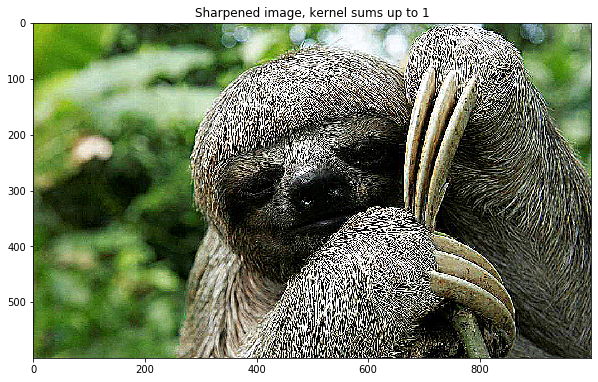

In [360]:
sharp_img = cv2.filter2D(sloth2, -1, sharpening_kernel)
show_img(sharp_img, "Sharpened image, kernel sums up to 1")

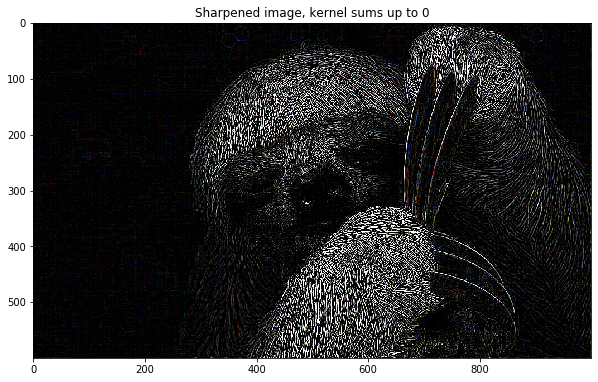

In [361]:
sharpening_kernel[1,1] = 8
sharp_img = cv2.filter2D(sloth2, -1, sharpening_kernel)
show_img(sharp_img, "Sharpened image, kernel sums up to 0")

## Thresholding / binarization

In [390]:
threshold = 127
max_value = 255

In [401]:
ret1, thresh1 = cv2.threshold(img, threshold, max_value, cv2.THRESH_BINARY)

ret2, thresh_binary_inverted = cv2.threshold(img, threshold, max_value, cv2.THRESH_BINARY_INV)

ret3, thresh3 = cv2.threshold(img, threshold, max_value, cv2.THRESH_TRUNC)

ret4, thresh4 = cv2.threshold(img, threshold, max_value, cv2.THRESH_TOZERO)

ret5, thresh5 = cv2.threshold(img, threshold, max_value, cv2.THRESH_TOZERO_INV)


In [402]:
print(ret1, ret2, ret3, ret4, ret5)

127.0 127.0 127.0 127.0 127.0


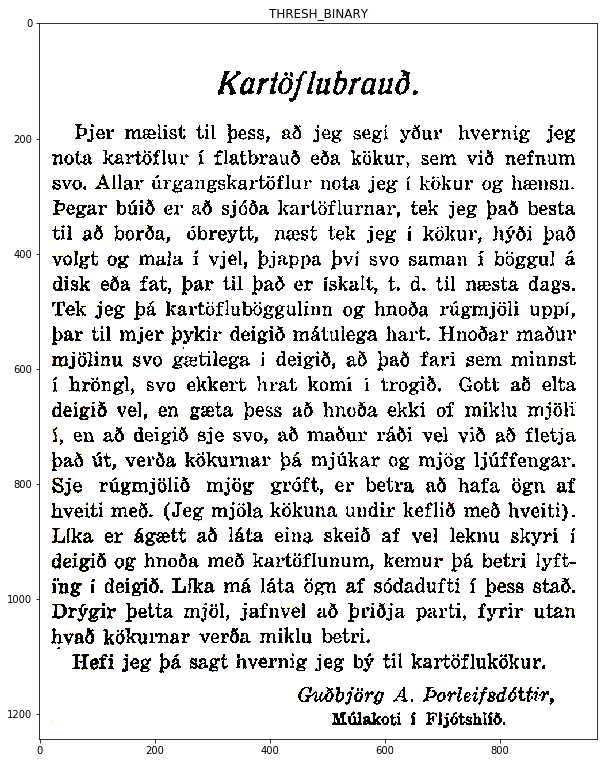

In [403]:
show_img(thresh1, "THRESH_BINARY") 

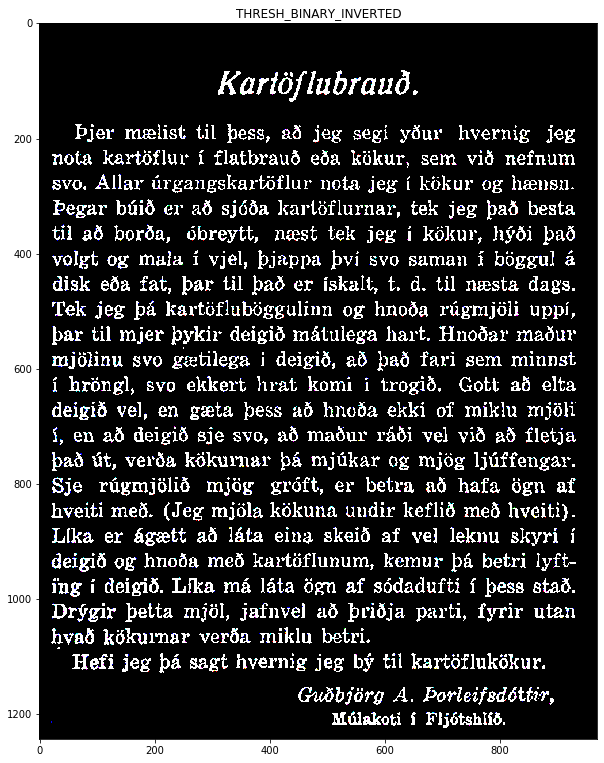

In [404]:
# used a lot in computer vision
show_img(thresh_binary_inverted, "THRESH_BINARY_INVERTED")

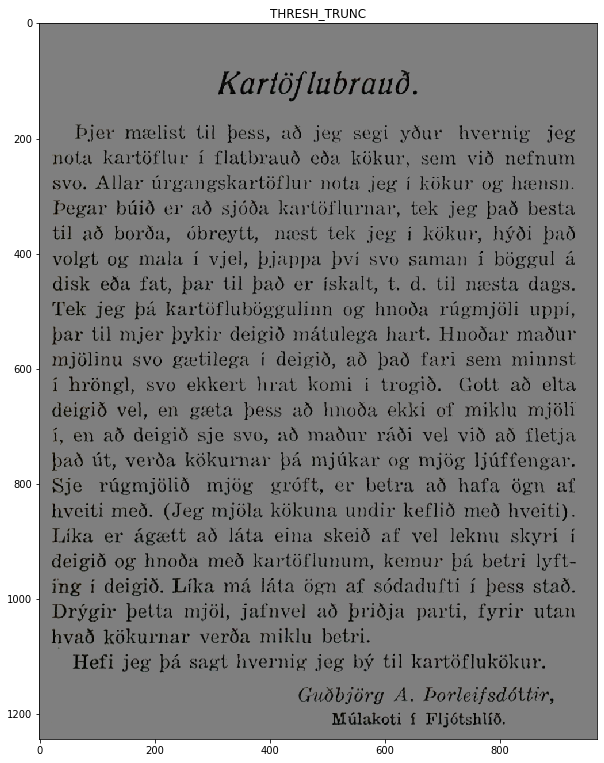

In [405]:
show_img(thresh3, "THRESH_TRUNC")

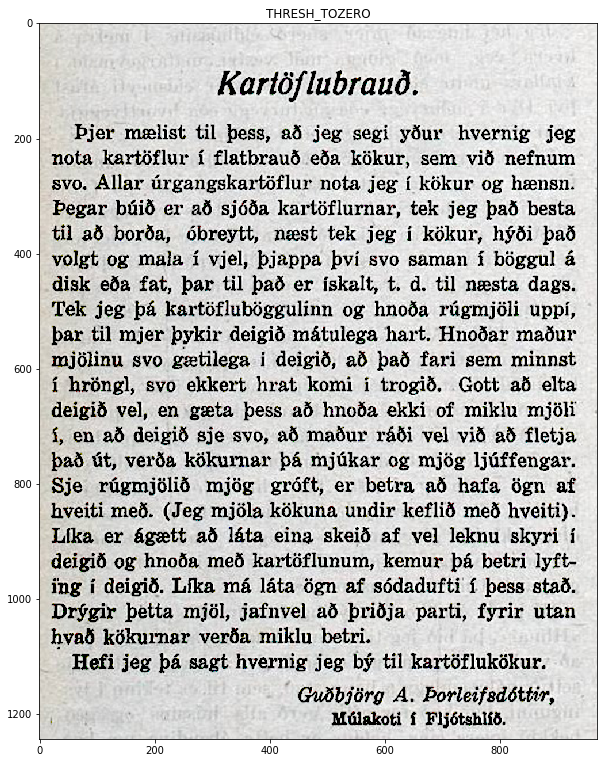

In [406]:
show_img(thresh4, "THRESH_TOZERO")

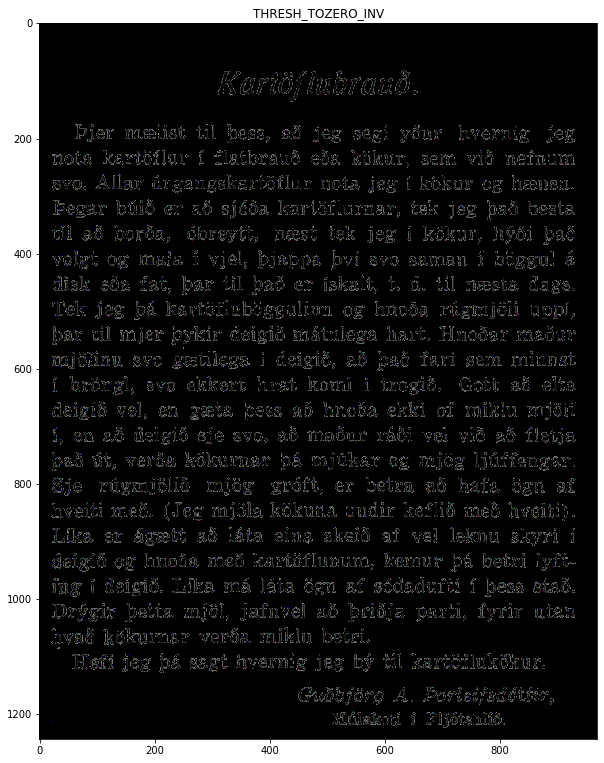

In [407]:
show_img(thresh5, "THRESH_TOZERO_INV")

## Adaptive thresholding

For adaptive thresholding we need to work with a grayscale image.

In [424]:
img_gray = cv2.cvtColor(recipe, cv2.COLOR_BGRA2GRAY)

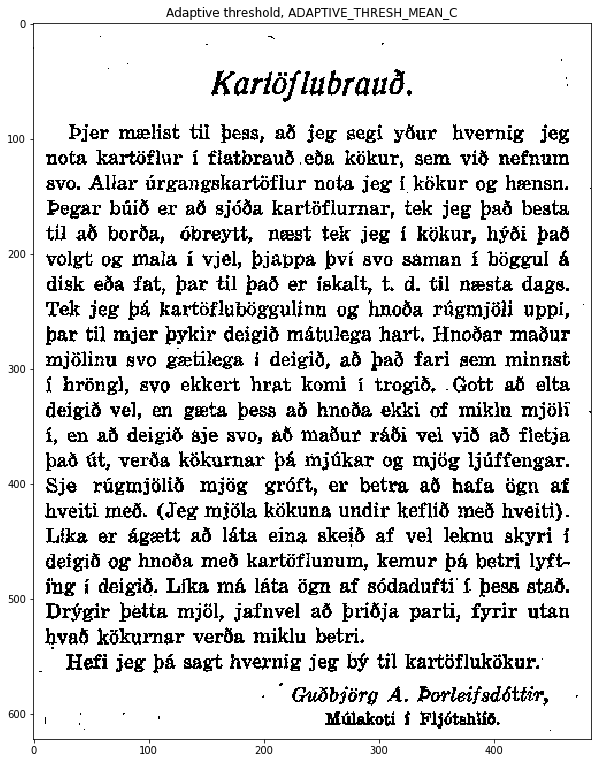

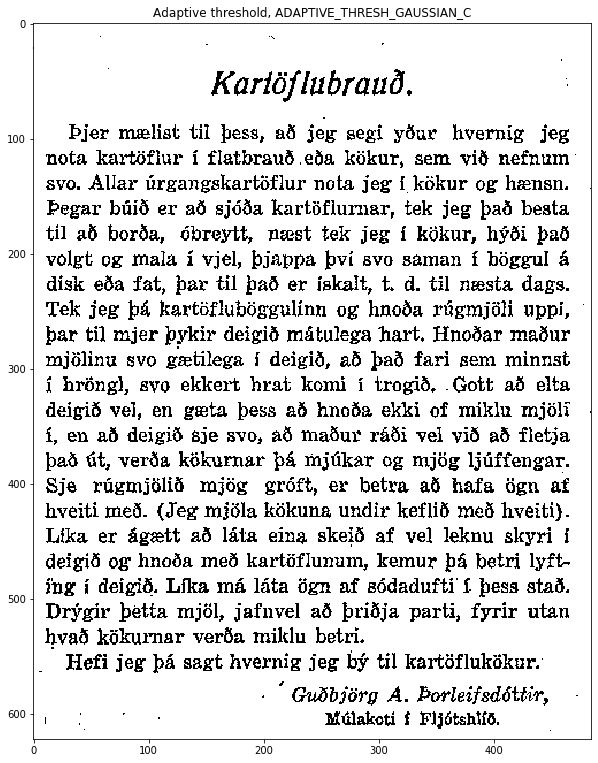

In [446]:
th2 = cv2.adaptiveThreshold(img_gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 31, 35)

th3 = cv2.adaptiveThreshold(img_gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 31, 35)

show_grayscale_img(th2, "Adaptive threshold, ADAPTIVE_THRESH_MEAN_C")

show_grayscale_img(th3, "Adaptive threshold, ADAPTIVE_THRESH_GAUSSIAN_C")


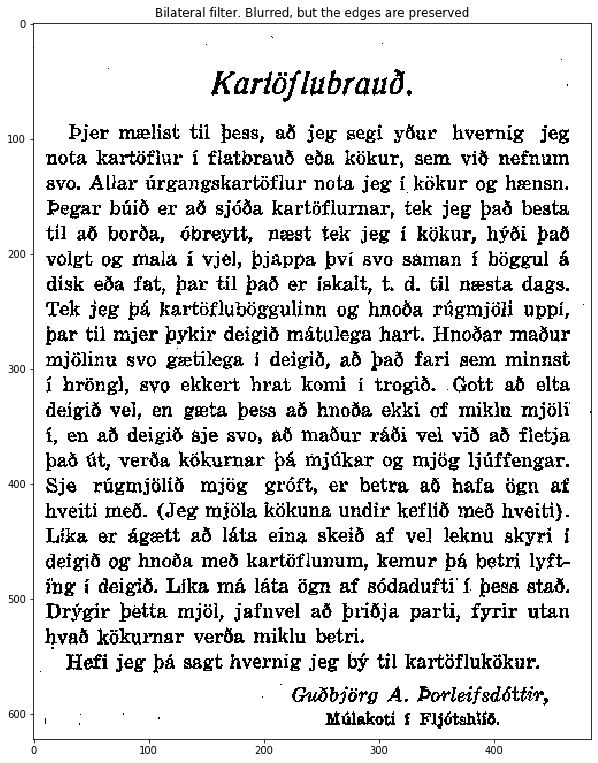

In [443]:
blur = cv2.bilateralFilter(th2, 9,33,33)
show_grayscale_img(blur, "Bilateral filter. Blurred, but the edges are preserved")

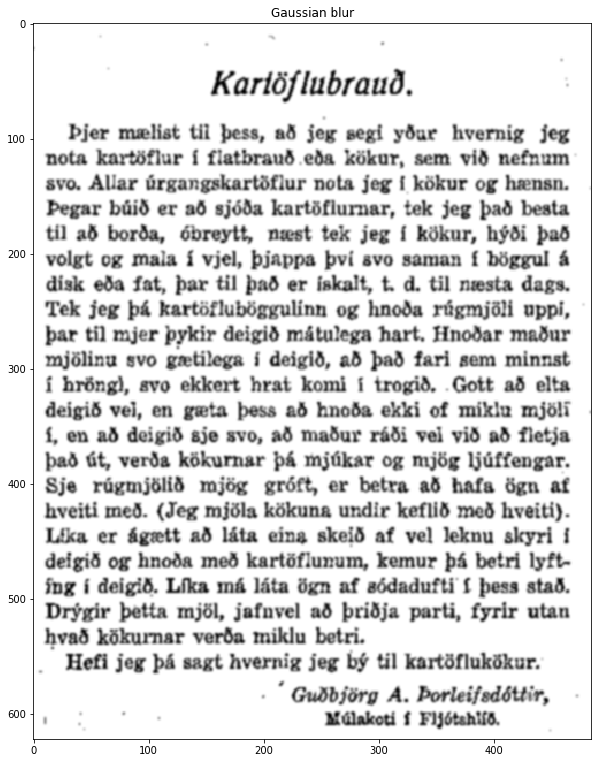

In [454]:
gaussian_blur = cv2.GaussianBlur(th3,(5,5),0) # can only use odd numbers!
show_grayscale_img(gaussian_blur, "Gaussian blur")

## Really dark image

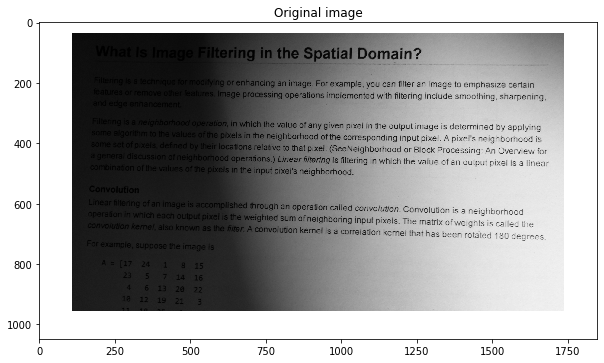

In [461]:
text_img = cv2.imread("img/notes.png")
show_img(text_img, "Original image")
# turn to grayscale

text_img_gray = cv2.cvtColor(text_img, cv2.COLOR_BGR2GRAY)

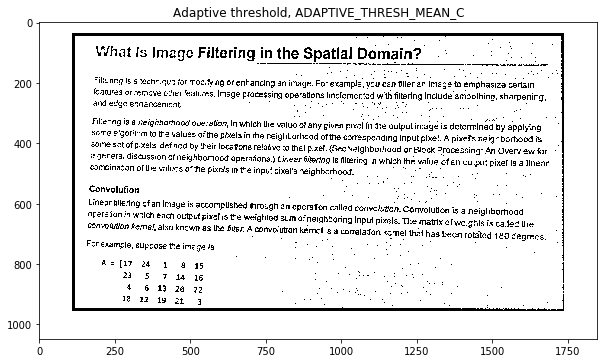

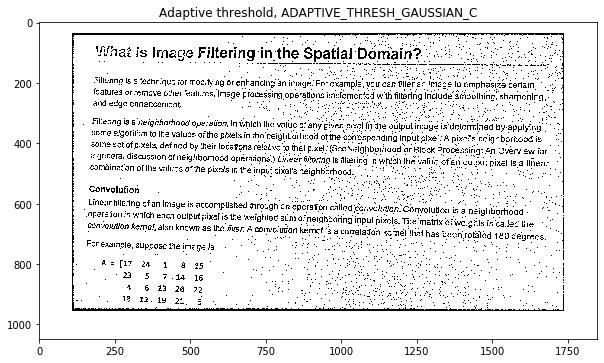

In [490]:
# first number: set a window to a number
# second number: the bigger the brighter
th2 = cv2.adaptiveThreshold(text_img_gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 21, 5)
th3 = cv2.adaptiveThreshold(text_img_gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 17, 3)

show_grayscale_img(th2, "Adaptive threshold, ADAPTIVE_THRESH_MEAN_C")

show_grayscale_img(th3, "Adaptive threshold, ADAPTIVE_THRESH_GAUSSIAN_C")


## Otsu's thresholding

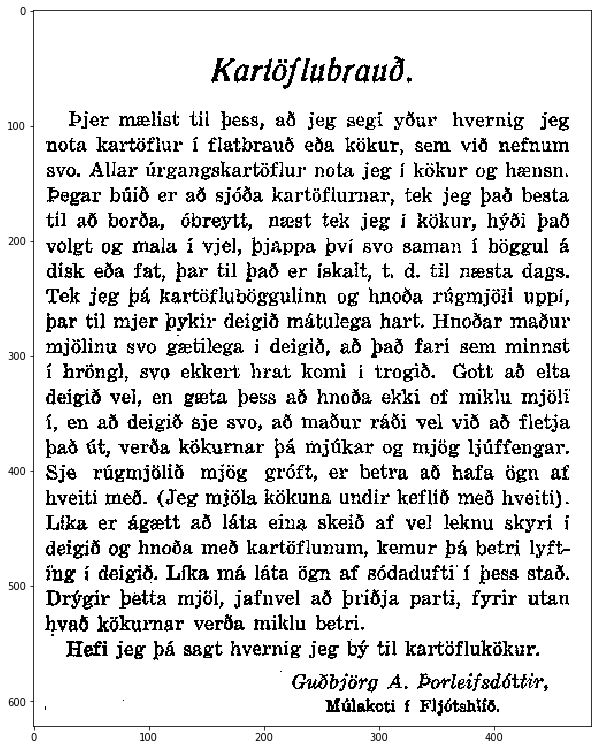

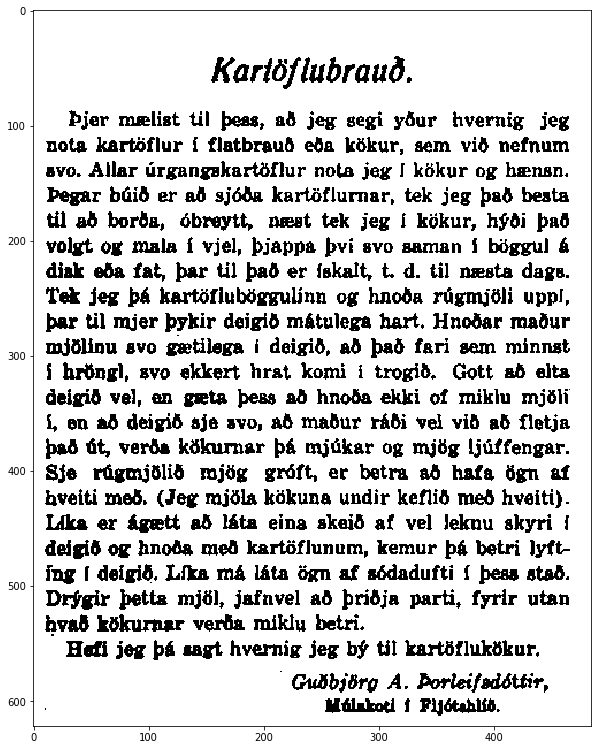

In [504]:
#in otsu we don't set the threshold value ourselves
ret2, otsu = cv2.threshold(img_gray, 255, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# otsu's thresholding 
blur = cv2.GaussianBlur(img_gray, (3,3), 0)
ret3, otsu_gaussianblur = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

show_grayscale_img(otsu)
show_grayscale_img(otsu_gaussianblur)
#cv2.imwrite("output/otsu.png", "PNG")


## Dilate

We dilate using an inverted picture (from above).

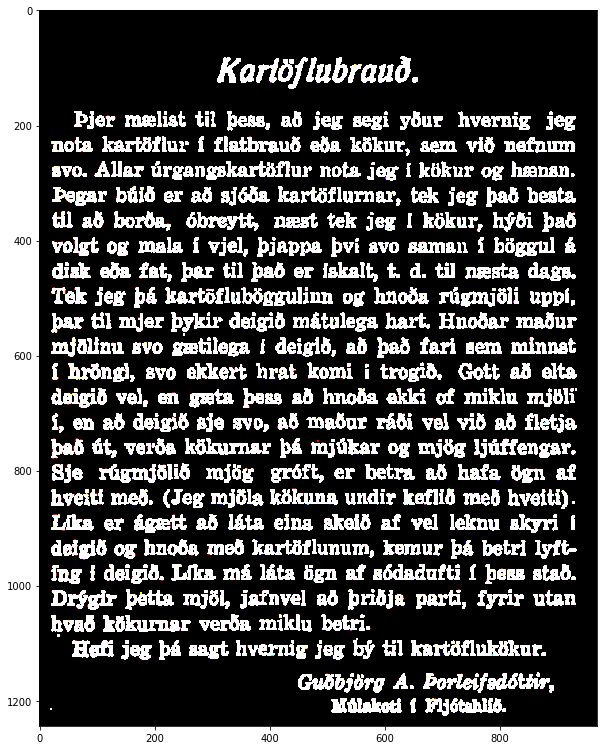

In [542]:
kernel = np.ones((3,3), np.uint8)
dilated_text = cv2.dilate(thresh_binary_inverted, kernel, iterations=1)

show_grayscale_img(dilated_text)

## Erosion

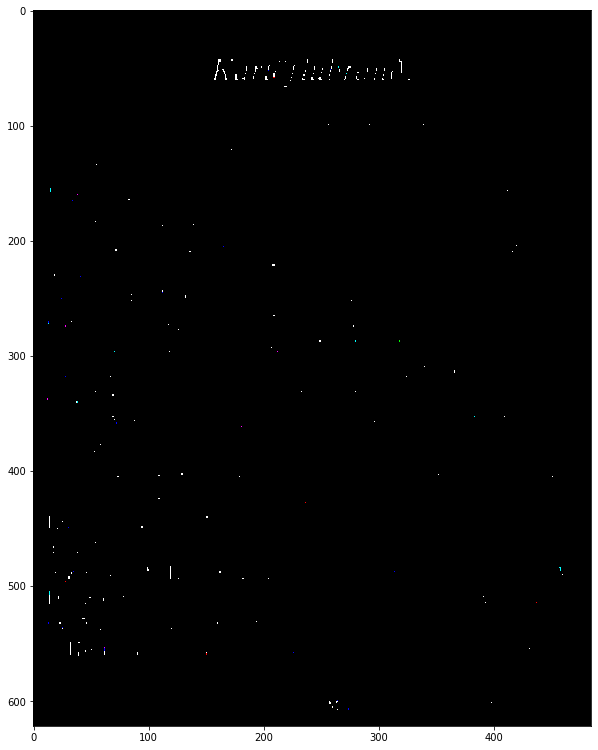

In [544]:
eroded_text = cv2.erode(h, kernel, iterations=1)
show_img(eroded_text)

## Morphological Transformations : Opening/closing

### Opening is erosion followed by dilation

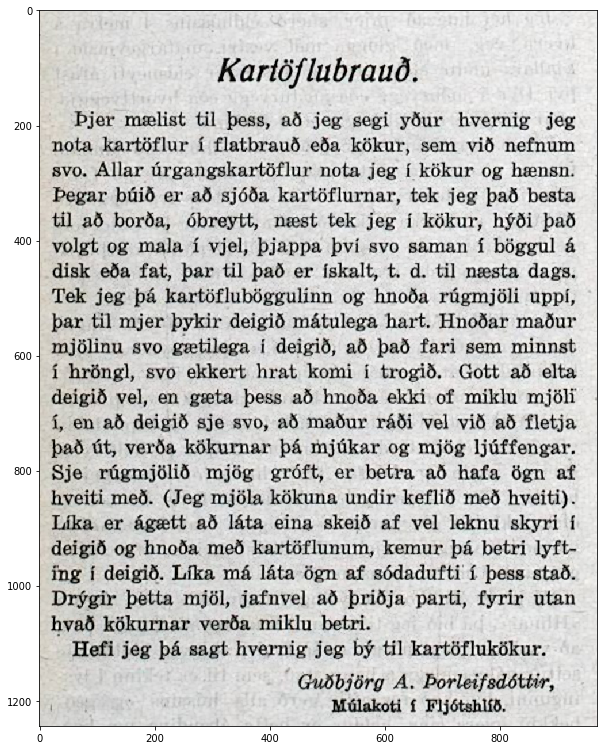

In [547]:

opening = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel, iterations=1)
show_img(opening)

### Closing is dilation followed by erosion

Useful for closing small holes inside the foreground objects.

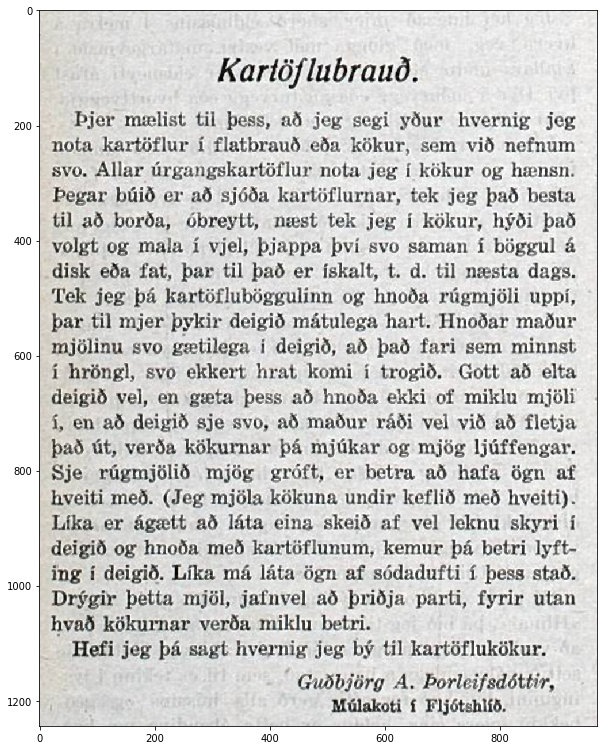

In [556]:
closing = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel, iterations=1)
show_img(closing)

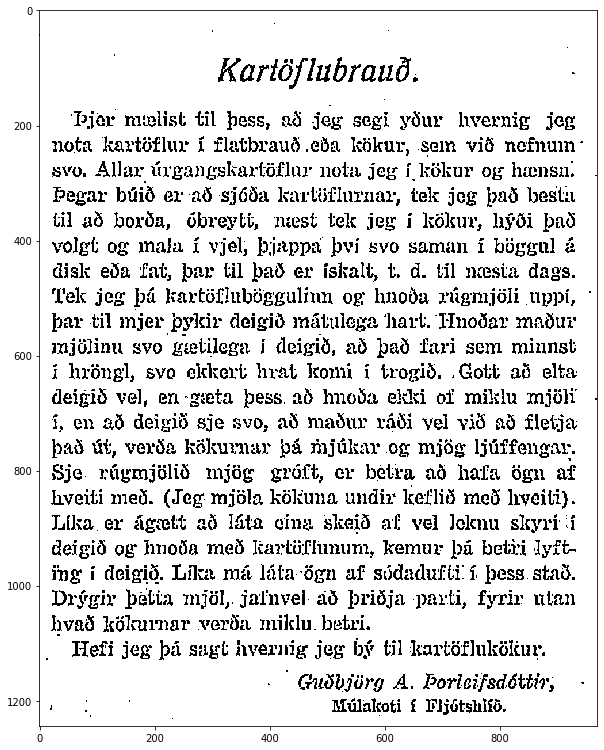

In [577]:
closing_gray = cv2.cvtColor(closing, cv2.COLOR_BGR2GRAY)
closing_and_threshold = cv2.adaptiveThreshold(closing_gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 7, 15)
show_grayscale_img(closing_and_threshold)

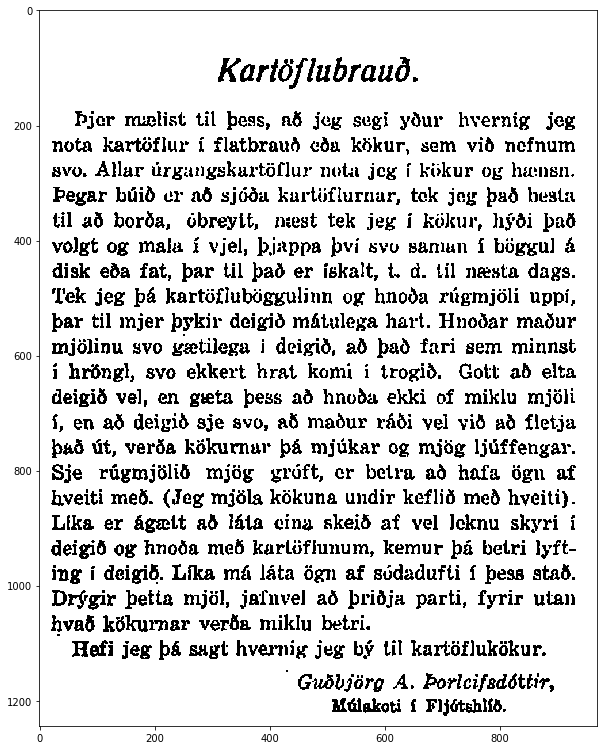

In [583]:
ret1, thresh1 = cv2.threshold(closing_gray, threshold, max_value, cv2.THRESH_OTSU)
show_grayscale_img(thresh1)

## Edge detection

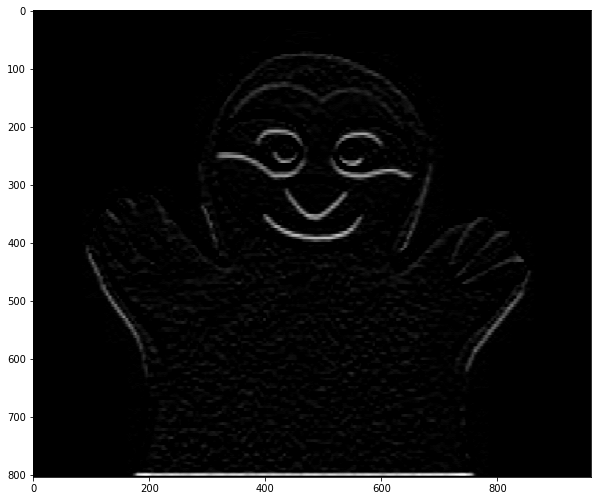

In [603]:
gray_sloth = cv2.cvtColor(sloth_lowres, cv2.COLOR_BGR2GRAY)

scale = 1
delta = 0
x_orientation = 1
y_orientation = 1
ddepth =cv2.CV_8U
edges = cv2.Sobel(gray_sloth, ddepth, 0, 1, ksize=3, scale=scale, delta=delta, borderType=cv2.BORDER_DEFAULT)

show_grayscale_img(edges)

### Canny edge detection

Does a lot of things in the background:
* Asks the user to enter a numerical value to set the lower threshold for our Canny Edge Detector (by means of a Trackbar)
* Applies the Canny Detector and generates a mask (bright lines representing the edges on a black background).
* Applies the mask obtained on the original image and display it in a window.


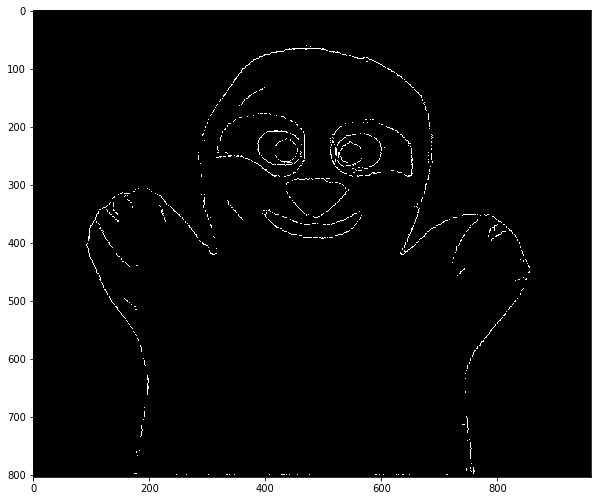

In [638]:
edges = cv2.Canny(gray_sloth, 15, 90)
show_grayscale_img(edges)

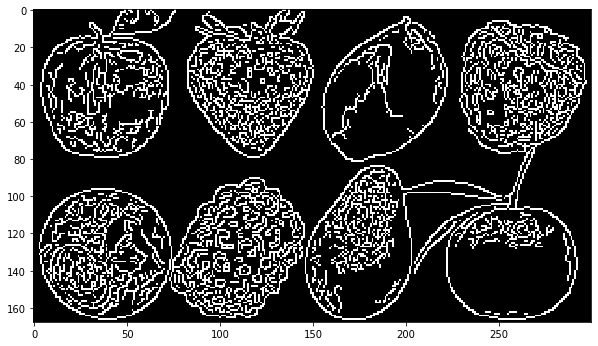

In [643]:
fruit = cv2.imread("img/fruit.jpeg")
gray_fruit = cv2.cvtColor(fruit, cv2.COLOR_BGR2GRAY)


edges = cv2.Canny(gray_fruit, 60, 120)
show_grayscale_img(edges)

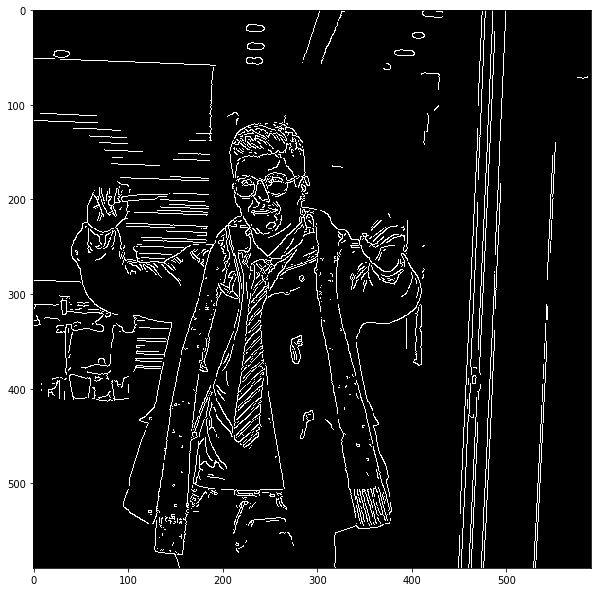

In [645]:
jan = cv2.imread("img/janpotter.png")
gray_jan = cv2.cvtColor(jan, cv2.COLOR_BGR2GRAY)


edges = cv2.Canny(gray_jan, 90, 127)
show_grayscale_img(edges)

## Perspective

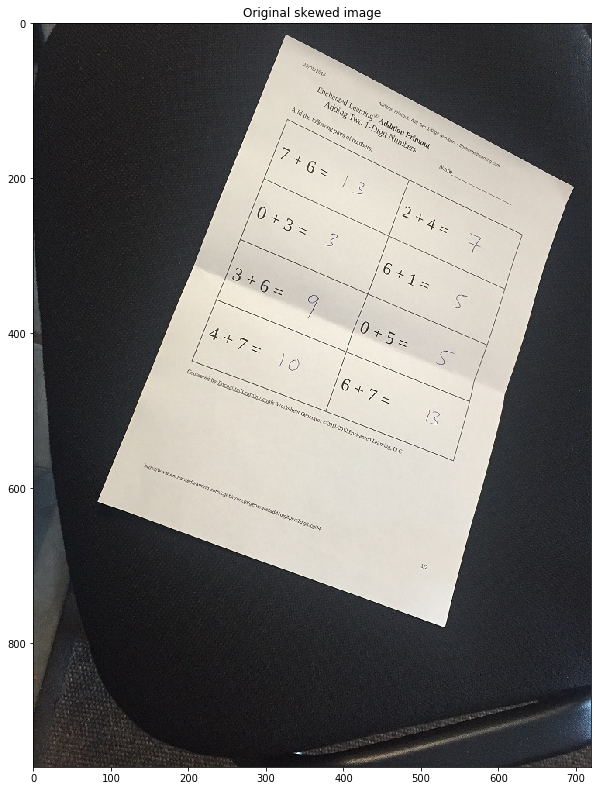

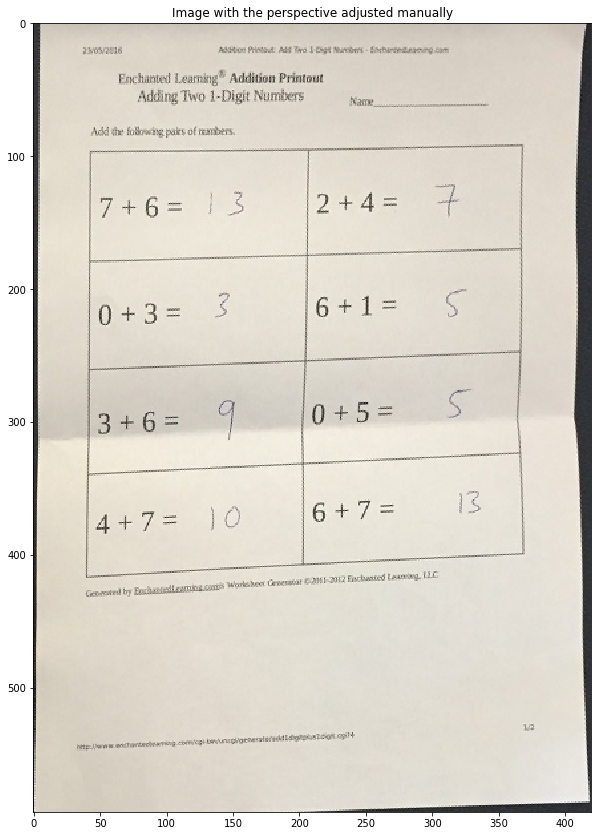

In [653]:

img = cv2.imread("img/scan.jpg")
# Coordinates of the 4 corners of the original image
# here the points have been calculated manually, but this should really be automated to be useful
points_A = np.float32([[320,15], [700,215], [85,610], [530, 789]])

# Coordinates of the 4 corners of the desired output
points_B = np.float32([[0,0], [420,0], [0,594], [420,594]])

# Use the two sets of four points to compute the perspective transformation matrix, M

M = cv2.getPerspectiveTransform(points_A, points_B)
warped = cv2.warpPerspective(img, M , (420, 594))

show_img(img, "Original skewed image")
show_img(warped, "Image with the perspective adjusted manually")

In [654]:
## Handwriting recognition